# Iterative Kalman filter using the EM algorithm

This code can be used in both situation (using a PCA or not)
by giving a value to a variable name opt:
- When opt=0 that mean we don't use a PCA
- Any integer leads to to the application of a PCA on the data

# Imports of libraries

In [33]:
%load_ext autoreload
%autoreload 2

from Functions import *

import netCDF4 as nc
import numpy as np
import matplotlib.pyplot as plt
from numpy.linalg import inv
from numpy.linalg import pinv
from numpy.linalg import det
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
from scipy import stats
from scipy.stats import norm,kurtosis,skew
import imageio as iio
from IPython import display
from sklearn.decomposition import PCA


import xarray as xr

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Read data

In [34]:
fn='C:/M2_CSM/Stage/Stage/Codes/AIS_Gibraltar.nc'
ds=nc.Dataset(fn)

# Variables associated with each dimension
time=ds.variables['time']
lat=ds.variables['lat']
long=ds.variables['lon']


# Other variables
u_oi=ds.variables['u'] # Eastward Water Velocity get by optimal interpolation (m.s^-1)
v_oi=ds.variables['v'] # Northward Water Velocity get by optimal interpolation (m.s^-1)
u_ais=ds.variables['u_obs'] # Eastward Water Velocity from AIS (m.s^-1)
v_ais=ds.variables['v_obs'] # Northward Water Velocity form AIS (m.s^-1)
var_u_ais=ds.variables['err_u'] # Estimated Eastward Water Velocity variance error from AIS (m.s^-1)
var_v_ais=ds.variables['err_v'] # Estimated Northward Water Velocity variance error from AIS (m.s^-1)
u_hf=ds.variables['u_hf'] # Eastward component from HF radar (m.s^-1)
v_hf=ds.variables['v_hf'] # # Northward component from HF radar (m.s^-1)

# Mask 
mask=ds.variables['mask']
mask=mask[:].data
mask=mask.flatten()

In [35]:
T=time.size # Number of time steps
La=lat.size # Number of latitude 
Lo=long.size # Number of longitude
r=2*La*Lo # size of the state vector

Data needed to display observation with cartopy

In [36]:
LONG,LAT=np.meshgrid(long[:].data,lat[:].data)

extent=[np.min(LONG),np.max(LONG),np.min(LAT),np.max(LAT)]
central_lat=np.mean(LAT)
central_long=np.mean(LONG)
pcar=ccrs.PlateCarree()

# Modification of data 

Construction of vectors u,v and their variances for ais observation and satellite observation

In [37]:
# Vectors u and v for ais observations  
u_ais=u_ais[:].data
v_ais=v_ais[:].data
u=u_ais.flatten()
v=v_ais.flatten()

# Vectors of variances of u and v 
var_u_ais=var_u_ais[:].data
var_v_ais=var_v_ais[:].data
var_u=var_u_ais.flatten()
var_v=var_v_ais.flatten()

# Vectors u and v for HF radar observation
u_hf=u_hf[:].data
v_hf=v_hf[:].data

# Vectors u and v for optimal interpolation
u_oi=u_oi[:].data
v_oi=v_oi[:].data



Check if u and var_u have the same number of NaN and at the same index. Same things for v and var_v. If not the index concerned is modified by a NaN

In [38]:
for i in range(len(u)):
            if np.isnan(u[i])==True:
                var_u[i]=np.nan
            if np.isnan(v[i])==True:
                var_v[i]=np.nan
            if np.isnan(var_u[i])==True:
                u[i]=np.nan
            if np.isnan(var_v[i])==True:
                v[i]=np.nan

Creation of the observation vector and its associated variance

In [39]:
# Reshape u and v
u=np.reshape(u,(T,La,Lo))
v=np.reshape(v,(T,La,Lo))
var_u=np.reshape(var_u,(T,La,Lo))
var_v=np.reshape(var_v,(T,La,Lo))

# Création of y and var_y
y=np.zeros((T,r))
var_y=np.zeros((T,r))

# Creation of y_hf
yhf=np.zeros((T,r))

# Creation of y_oi
y_oi=np.zeros((T,r))

for t in range(T):
    y[t,:]=np.concatenate((u[t,:,:].flatten(),v[t,:,:].flatten()))
    var_y[t,:]=np.concatenate((var_u[t,:,:].flatten(),var_v[t,:,:].flatten()))
    yhf[t,:]=np.concatenate((u_hf[t,:,:].flatten(),v_hf[t,:,:].flatten()))
    y_oi[t,:]=np.concatenate((u_oi[t,:,:].flatten(),v_oi[t,:,:].flatten()))

# Observations

Observation ais 

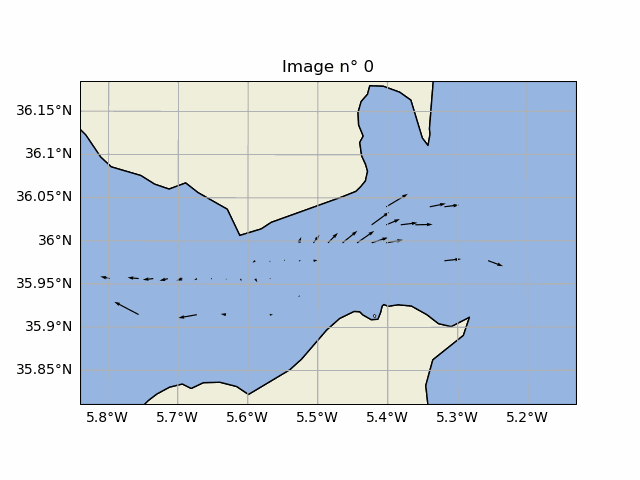

In [40]:
# Cartopy with ais observations
"""
for t in range(T):
    plt.figure()
    ax=plt.axes(projection=ccrs.Orthographic(central_long,central_lat))
    ax.set_extent(extent)
    gl=ax.gridlines(draw_labels=True)
    gl.top_labels=False
    gl.right_labels=False
    ax.coastlines()
    ax.add_feature(cfeature.LAND,edgecolor='black')
    ax.add_feature(cfeature.OCEAN)
    ax.quiver(LONG.flatten(),LAT.flatten(),u[t,:,:].flatten(),v[t,:,:].flatten(),transform=pcar) 
    plt.title('Image n° %i' %t )
    plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/plot_observation/observation'+str(t)+'.png')
    plt.close()

frames=np.stack([iio.imread('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/plot_observation/observation'+str(t)+'.png')for t in range(time[:].data.size)],axis=0)
iio.mimwrite('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/plot_observation/observations.gif',frames,duration=0.6)
"""
display.Image('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/plot_observation/observations.gif')


HF radar observation  

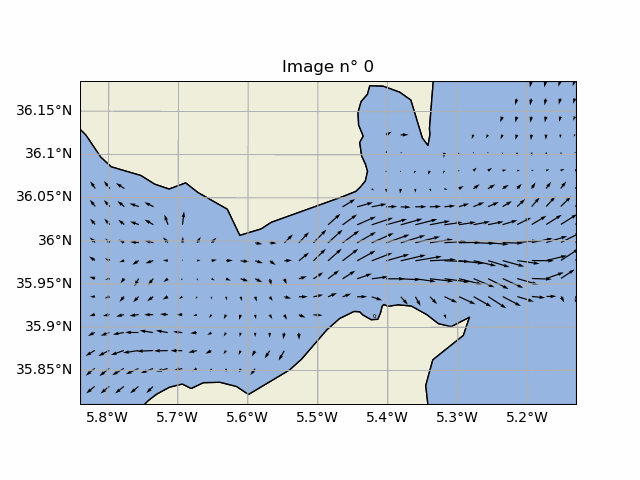

In [41]:
# Cartopy with HF radar observation 
"""
for t in range(T):
    plt.figure()
    ax=plt.axes(projection=ccrs.Orthographic(central_long,central_lat))
    ax.set_extent(extent)
    gl=ax.gridlines(draw_labels=True)
    gl.top_labels=False
    gl.right_labels=False
    ax.coastlines()
    ax.add_feature(cfeature.LAND,edgecolor='black')
    ax.add_feature(cfeature.OCEAN)
    ax.quiver(LONG,LAT,u_hf[t,:,:],v_hf[t,:,:],transform=pcar)
    plt.title('Image n° %i' %t)
    plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/obssat/obssat'+str(t)+'.png')
    plt.close()

frames=np.stack([iio.imread('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/obssat/obssat'+str(t)+'.png')for t in range(time[:].data.size)],axis=0)
iio.mimwrite('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/obssat/obssat.gif',frames,duration=0.6)   
"""
display.Image('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/obssat/obssat.gif')


# Sample of data

We set the variable opt here :
- If opt=0, that mean we use only a part of the data which can be allocated ( no PCA use here)
- If opt!=0, that mean we use a PCA here
Lists of line and column are not the same,according to the value of opt 


# Remove all land part 

In [42]:
# Variable option use to know if we apply a PCA or not on data
opt=1

In [43]:
ny,var_ny,nLAT,nLONG,nr,indland=remland(u,v,var_u,var_v,mask,LAT,LONG)
nyh,var_ny,nLAT,nLONG,nr,indland=remland(u_hf,v_hf,var_u,var_v,mask,LAT,LONG)

In [44]:
# Test pour ACP car reste des NaN en dehors du mask

for t in range(T):
    for i in range(nr):
        if np.isnan(nyh[t,i])==True:
            nyh[t,i]=0

# Initialisation 

In this part we are going to initialize M,Q,R,H,x0 and P0 for the first Kalman filter.
In the function below all the arguments are not used, that depend of the value of opt.

In [45]:
n=50 # Number of components (use for the PCA,but ask in the function)
M,Q,R,x0,P0=IC(opt,nr,n,nLONG,nLAT,ny,var_ny)
if opt==0:
    H=np.eye(nr) 
else:
    pca=PCA(n_components=n)
    EOF=pca.fit(nyh)
    H=np.transpose(EOF.components_)


# Apply the iterative Kalman filter using EM algotithm

In [46]:
N=10 # number of iteration 
slk,M,Q,R,xs,Ps=Kalman_EM(ny,var_ny,x0,P0,M,Q,R,H,N,opt)

c:\M2_CSM\Stage\Stage\Codes\Kalman\codes\Functions.py:215: RuntimeWarning: invalid value encountered in divide
  R=R/CO


In [47]:
print('index max of slk is:',np.argmax(slk)) # use to know the maximum and where we get the best result

index max of slk is: 9


# Results

Loglikelihood

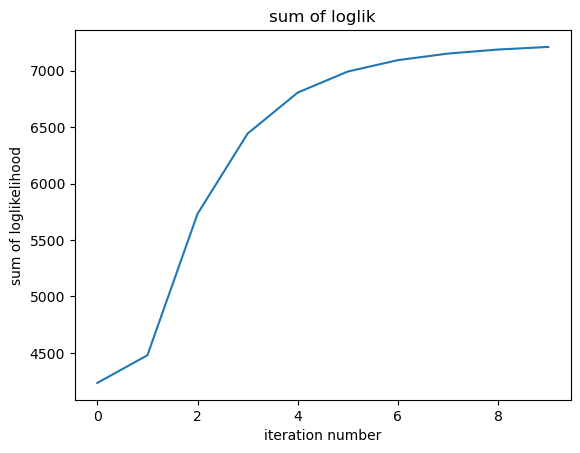

In [48]:
plt.figure()
plt.plot(np.linspace(0,N-1,N),slk)
plt.title("sum of loglik")
plt.xlabel('iteration number')
plt.ylabel("sum of loglikelihood")
plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/Results/LoglikEMsat.png')


Matrix M,Q and R

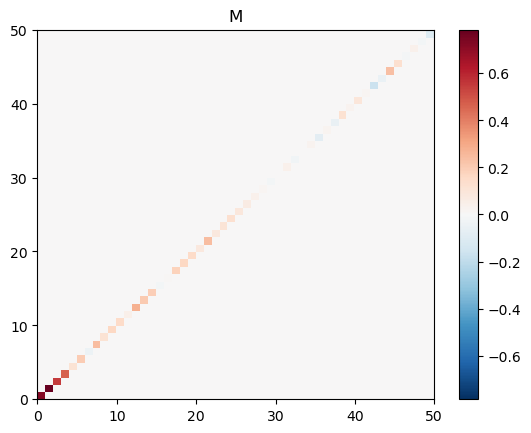

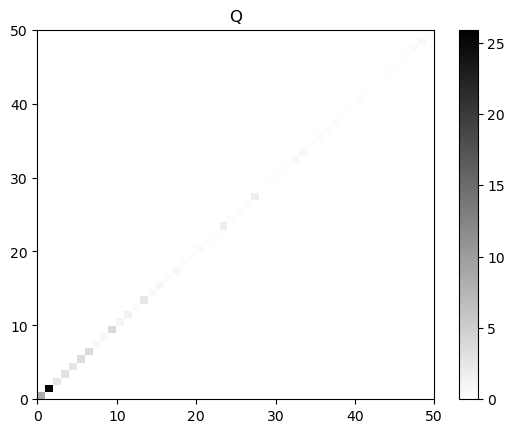

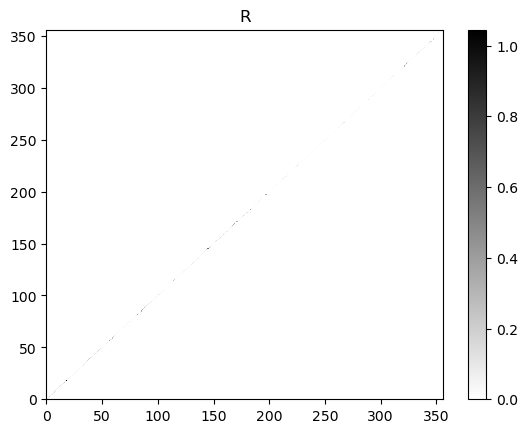

In [49]:
a=np.max((abs(np.min(M)),abs(np.max(M))))

plt.figure()
plt.pcolor(M,cmap='RdBu_r',vmin=-a,vmax=a)
plt.colorbar()
plt.title('M')
plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/Results/MEMpseudosat.png')

plt.figure()
plt.pcolor(Q,cmap='gist_yarg')
plt.colorbar()
plt.title('Q')
plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/Results/QEMpseudosat.png')

plt.figure()
plt.pcolor(R[0,:,:],cmap='gist_yarg')
plt.colorbar()
plt.title('R')
plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/Results/REMpseudosat.png')

### Passage into the canonical base

This part is use if opt!=0 , that mean a PCA on the data is used.

In [50]:
if opt!=0:
    nxs=np.zeros((T,nr))
    nPs=np.zeros((T,nr,nr))
    for t in range(T):
        nxs[t,:]=np.transpose(H@np.transpose(np.array([xs[t,:]])))
        nPs[t,:]=H@Ps[t,:,:]@np.transpose(H)
    xs=pca.inverse_transform(xs)
    print(nxs[0,:]-xs[0,:])
    xs=nxs
    Ps=nPs

[-2.30329986e-01 -2.36624494e-01 -2.39255617e-01 -2.59987626e-01
 -1.94089358e-01  0.00000000e+00 -3.07065601e-01 -2.93800280e-01
 -2.85257211e-01 -2.76843198e-01 -2.54420769e-01 -2.35069819e-01
 -1.86906704e-01 -9.62390075e-02  9.07602028e-03  7.82005436e-02
 -2.71343527e-02 -9.65973990e-02  2.61343646e-03 -1.56993517e-01
 -3.76512084e-01 -3.81681969e-01 -3.75905617e-01 -3.52635041e-01
 -3.40176735e-01 -3.20210530e-01 -3.12159412e-01 -2.80855202e-01
 -2.18364559e-01 -1.17761309e-01 -1.08931708e-01 -2.13437653e-01
 -2.03484680e-01 -1.31535821e-01 -2.96353196e-01 -4.56424776e-01
 -5.66249661e-01 -4.93038066e-32 -1.66351316e-01 -4.38187952e-01
 -4.49825852e-01 -4.68594847e-01 -4.54506994e-01 -4.40686917e-01
 -4.08897194e-01 -3.78262700e-01 -3.47898334e-01 -3.19111741e-01
 -2.95300282e-01 -3.71244265e-01 -3.47734183e-01 -3.12598974e-01
 -5.40867273e-01 -7.43343045e-01 -8.52820150e-01 -8.46896200e-01
 -8.17478850e-01 -6.47901944e-01 -6.21003940e-01 -4.65348042e-01
 -4.89855125e-01 -5.28176

# Add the land remove before KalmanEM

In [51]:
xs,Ps,us,vs=reiland(xs,Ps,indland)

In [52]:
if opt!=0:
    print('min=',np.min(nxs),'max=',np.max(nxs))
    print(np.shape(Ps),np.nanmin(Ps),np.nanmax(Ps))

min= -1.7868747897680333 max= 2.832873477052476
(168, 1330, 1330) -0.4648560942918919 1.5066241370185387


In [53]:
if opt==0:
    print('min =',np.nanmin(xs),'max =',np.nanmax(xs))
    print('Ps min =',np.nanmin(Ps),'max =',np.nanmax(Ps))

Graphics of xs 

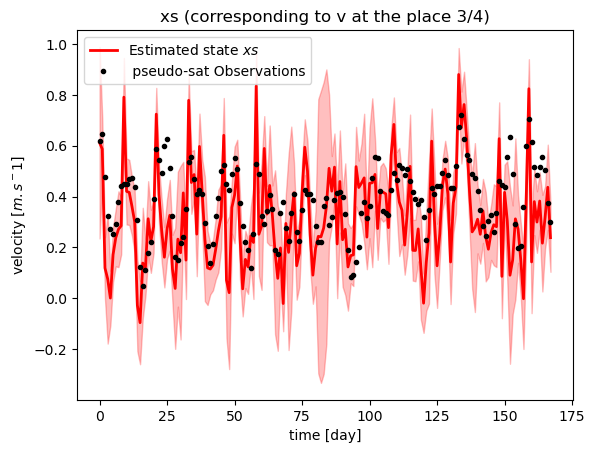

In [54]:
mid=int(len(xs[0,:])/2)
quart=int(len(xs[0,:])/4)
tquart=int(3*len(xs[0,:])/4)
plt.figure()
plt.plot(np.linspace(0,y.shape[0]-1,y.shape[0]),xs[:,tquart],'r',linewidth=2,label='Estimated state $xs$')
plt.plot(np.linspace(0,y.shape[0]-1,y.shape[0]),yhf[:,tquart],'.k',label=' pseudo-sat Observations')
#plt.plot(np.linspace(0,yc.shape[0]-1,yc.shape[0]),y_sat[:,tquart],color='blue',label='satelitte observations')
plt.fill_between(np.linspace(0,y.shape[0]-1,y.shape[0]),xs[:,tquart]-1.96*np.sqrt(Ps[:,tquart,tquart]),xs[:,tquart]+1.96*np.sqrt(Ps[:,tquart,tquart]),alpha=0.25,color='red')
#plt.ylim(-0.2,0.4)
plt.legend(loc='best')
plt.xlabel('time [day]')
plt.ylabel('velocity [$m.s^-1$]')
plt.title('xs (corresponding to v at the place 3/4)')
plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/Results/xspseudo_sat.png')

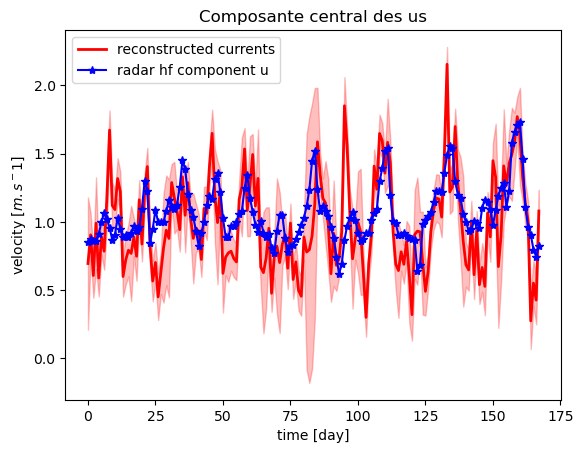

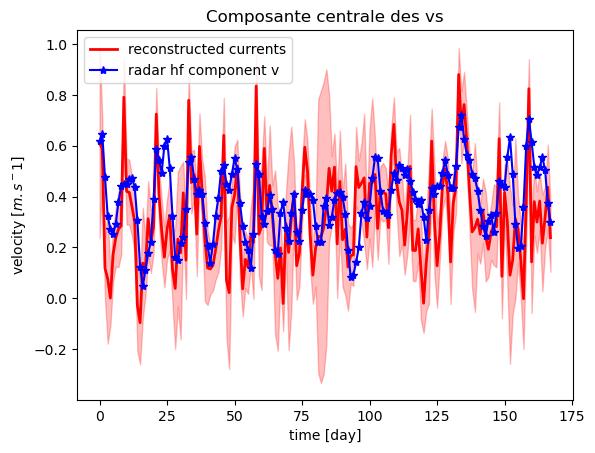

In [55]:
#Résulats pour le centre des u et le centre des v par rapport au temps 

u_r=np.zeros((T,mid)) # ajout 
v_r=np.zeros((T,mid))  # ajout

for t in range(T):
    
    u_r[t,:]=yhf[t,0:mid] # ajout
    v_r[t,:]=yhf[t,mid:]  # ajout 

middir=int(len(us[0,:])/2)

plt.figure()
plt.plot(np.linspace(0,y.shape[0]-1,y.shape[0]),us[:,middir],'r',linewidth=2,label='reconstructed currents')
plt.fill_between(np.linspace(0,y.shape[0]-1,y.shape[0]),us[:,middir]-1.96*np.sqrt(Ps[:,middir,middir]),us[:,middir]+1.96*np.sqrt(Ps[:,middir,middir]),alpha=0.25,color='red')
plt.plot(np.linspace(0,y.shape[0]-1,y.shape[0]),u_r[:,middir],color='blue',marker='*',label='radar hf component u')
#plt.ylim(-0.3,0.3)
plt.title('Composante central des us')
plt.legend(loc='best')
plt.ylabel('velocity [$m.s^-1$]')
plt.xlabel('time [day]')
plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/Results/uspseudo_sat.png')

plt.figure()
plt.plot(np.linspace(0,y.shape[0]-1,y.shape[0]),vs[:,middir],'r',linewidth=2,label='reconstructed currents')
plt.fill_between(np.linspace(0,y.shape[0]-1,y.shape[0]),vs[:,middir]-1.96*np.sqrt(Ps[:,mid+middir,mid+middir]),vs[:,middir]+1.96*np.sqrt(Ps[:,mid+middir,mid+middir]),alpha=0.25,color='red')
plt.plot(np.linspace(0,y.shape[0]-1,y.shape[0]),v_r[:,middir],color='blue',marker='*',label='radar hf component v')
#plt.ylim(-0.2,0.4)
plt.legend(loc='best')
plt.title('Composante centrale des vs')
plt.xlabel('time [day]')
plt.ylabel('velocity [$m.s^-1$]')
plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/Results/vspseudo_sat.png')

# Map of reconstructed currents which we add validation data

C:\Users\shank\AppData\Local\Temp\ipykernel_13688\4259939856.py:37: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  frames=np.stack([iio.imread('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/supresEM/kalsatEM'+str(t)+'.png')for t in range(time[:].data.size)],axis=0)


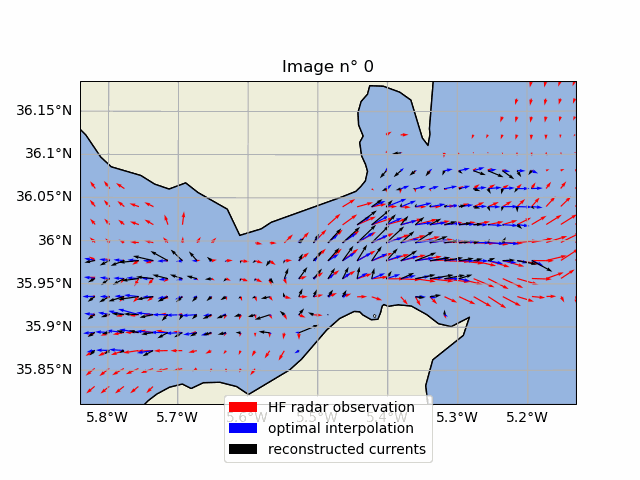

In [56]:
if opt==0:
    var_us=np.zeros((T,mid))
    var_vs=np.zeros((T,mid))
    for t in range(T):
        var_us[t,:]=np.diag(Ps[t,:,:])[0:mid]
        var_vs[t,:]=np.diag(Ps[t,:,:])[mid:]

#Reshape of all the data in array(time,lat,long)
us=np.reshape(us,(T,La,Lo))
vs=np.reshape(vs,(T,La,Lo))
if opt==0:
    var_us=np.reshape(var_us,(T,La,Lo))
    var_vs=np.reshape(var_vs,(T,La,Lo))



# Superposition des résultats de Kalman avec ceux des observations satellites 

for t in range(T):
    plt.figure()
    ax=plt.axes(projection=ccrs.Orthographic(central_long,central_lat))
    ax.set_extent(extent)
    gl=ax.gridlines(draw_labels=True)
    gl.top_labels=False
    gl.right_labels=False
    ax.coastlines()
    ax.add_feature(cfeature.LAND,edgecolor='black')
    ax.add_feature(cfeature.OCEAN)
    ax.quiver(LONG,LAT,u_hf[t,:,:],v_hf[t,:,:],color='red',label='HF radar observation',transform=pcar)
    ax.quiver(LONG,LAT,u_oi[t,:,:],v_oi[t,:,:],color='blue',label='optimal interpolation',transform=pcar)
    ax.quiver(LONG,LAT,us[t,:,:],vs[t,:,:],color='k',label='reconstructed currents',transform=pcar)
    plt.legend(bbox_to_anchor=(0,-0.2,1,0.2),loc="lower center")
    plt.title('Image n° %i' %t)
    plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/supresEM/kalsatEM'+str(t)+'.png')
    plt.close()

frames=np.stack([iio.imread('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/supresEM/kalsatEM'+str(t)+'.png')for t in range(time[:].data.size)],axis=0)
iio.mimwrite('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/supresEM/kalsat.gif',frames,duration=0.9)   

display.Image('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/supresEM/kalsat.gif')

In [57]:
RMSEoi=np.zeros((r))
RMSEkal=np.zeros((r))


for i in range(r):
    RMSEoi[i]=np.sqrt(np.nanmean((yhf[:,i]-y_oi[:,i])**2))
    RMSEkal[i]=np.sqrt(np.nanmean((yhf[:,i]-xs[:,i])**2))

pix=int((r/2))

RMSEoizonal=RMSEoi[0:pix]
RMSEoimeri=RMSEoi[pix:r]

RMSEkalzonal=RMSEkal[0:pix]
RMSEkalmeri=RMSEkal[pix:r]


C:\Users\shank\AppData\Local\Temp\ipykernel_13688\3346687005.py:6: RuntimeWarning: Mean of empty slice
  RMSEoi[i]=np.sqrt(np.nanmean((yhf[:,i]-y_oi[:,i])**2))
C:\Users\shank\AppData\Local\Temp\ipykernel_13688\3346687005.py:7: RuntimeWarning: Mean of empty slice
  RMSEkal[i]=np.sqrt(np.nanmean((yhf[:,i]-xs[:,i])**2))


RMSE of the optimal interpolation 

Text(0.5, 1.0, 'RMSE of the zonal component of oceanic currents with optimal interpolation')

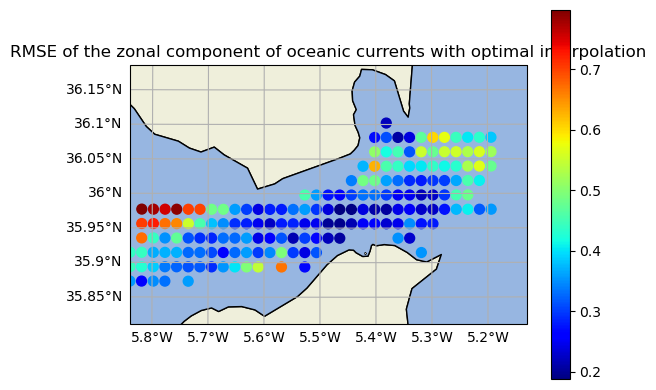

In [58]:
plt.figure()
ax=plt.axes(projection=ccrs.Orthographic(central_long,central_lat))
ax.set_extent(extent)
gl=ax.gridlines(draw_labels=True)
gl.top_labels=False
gl.right_labels=False
ax.coastlines()
ax.add_feature(cfeature.LAND,edgecolor='black')
ax.add_feature(cfeature.OCEAN)
cbzo=ax.scatter(LONG.flatten(),LAT.flatten(),s=50,c=RMSEoizonal,cmap='jet',transform=pcar)
plt.colorbar(cbzo,cmap='jet',orientation='vertical',ticklocation='auto')
plt.title('RMSE of the zonal component of oceanic currents with optimal interpolation')

Text(0.5, 1.0, 'RMSE of the southern component of oceanic currents with optimal interpolation')

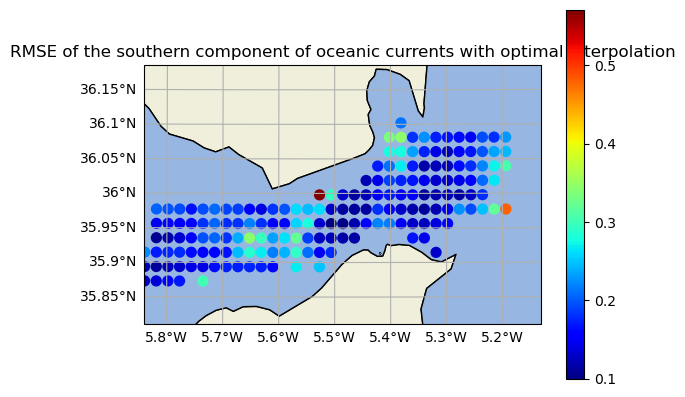

In [59]:
plt.figure()
ax=plt.axes(projection=ccrs.Orthographic(central_long,central_lat))
ax.set_extent(extent)
gl=ax.gridlines(draw_labels=True)
gl.top_labels=False
gl.right_labels=False
ax.coastlines()
ax.add_feature(cfeature.LAND,edgecolor='black')
ax.add_feature(cfeature.OCEAN)
cbzo=ax.scatter(LONG.flatten(),LAT.flatten(),s=50,c=RMSEoimeri,cmap='jet',transform=pcar)
plt.colorbar(cbzo,cmap='jet',orientation='vertical',ticklocation='auto')
plt.title('RMSE of the southern component of oceanic currents with optimal interpolation')

RMSE with the Kalman algorithm

Text(0.5, 1.0, 'RMSE of the zonal component of oceanic currents with kalman ')

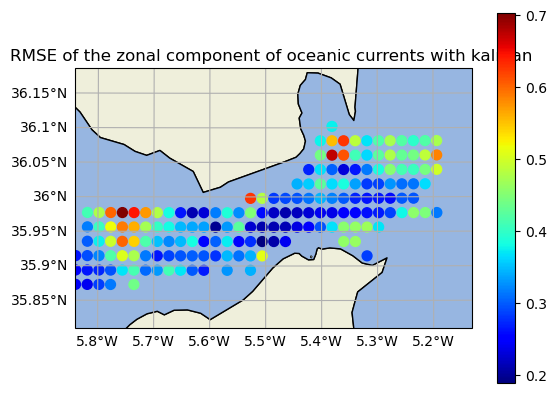

In [60]:
plt.figure()
ax=plt.axes(projection=ccrs.Orthographic(central_long,central_lat))
ax.set_extent(extent)
gl=ax.gridlines(draw_labels=True)
gl.top_labels=False
gl.right_labels=False
ax.coastlines()
ax.add_feature(cfeature.LAND,edgecolor='black')
ax.add_feature(cfeature.OCEAN)
cbzo=ax.scatter(LONG.flatten(),LAT.flatten(),s=50,c=RMSEkalzonal,cmap='jet',transform=pcar)
plt.colorbar(cbzo,cmap='jet',orientation='vertical',ticklocation='auto')
plt.title('RMSE of the zonal component of oceanic currents with kalman ')

Text(0.5, 1.0, 'RMSE of the southern component of oceanic currents with kalman')

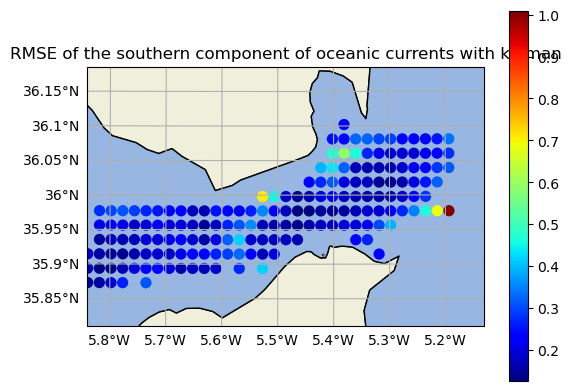

In [61]:
plt.figure()
ax=plt.axes(projection=ccrs.Orthographic(central_long,central_lat))
ax.set_extent(extent)
gl=ax.gridlines(draw_labels=True)
gl.top_labels=False
gl.right_labels=False
ax.coastlines()
ax.add_feature(cfeature.LAND,edgecolor='black')
ax.add_feature(cfeature.OCEAN)
cbzo=ax.scatter(LONG.flatten(),LAT.flatten(),s=50,c=RMSEkalmeri,cmap='jet',transform=pcar)
plt.colorbar(cbzo,cmap='jet',orientation='vertical',ticklocation='auto')
plt.title('RMSE of the southern component of oceanic currents with kalman')

# Save data in a netCDF

In [62]:

mask=np.reshape(mask,(La,Lo))

In [63]:


DS=xr.Dataset({'u':(('time','lat','lon'),u_oi),
               'v':(('time','lat','lon'),v_oi),
               'u_obs':(('time','lat','lon'),u_ais),
               'v_obs':(('time','lat','lon'),v_ais),
               'err_u':(('time','lat','lon'),var_u_ais),
               'err_v':(('time','lat','lon'),var_v_ais),
               'u_hf':(('time','lat','lon'),u_hf),
               'v_hf':(('time','lat','lon'),v_hf),
               'mask':(('lat','lon'),mask),
               'u_kal':(('time','lat','lon'),us),
               'v_kal':(('time','lat','lon'),vs)},
                coords={'time':('time',time[:].data.astype('datetime64[s]')),'lat':('lat',lat[:].data),
                'lon':('lon',long[:].data)})
DS.to_netcdf('KalACP_10ite_AIS_Gibraltar.nc')

C:\Users\shank\AppData\Local\Temp\ipykernel_13688\1337928073.py:1: UserWarning: Converting non-nanosecond precision datetime values to nanosecond precision. This behavior can eventually be relaxed in xarray, as it is an artifact from pandas which is now beginning to support non-nanosecond precision values. This warning is caused by passing non-nanosecond np.datetime64 or np.timedelta64 values to the DataArray or Variable constructor; it can be silenced by converting the values to nanosecond precision ahead of time.
  DS=xr.Dataset({'u':(('time','lat','lon'),u_oi),


# Correlation of a pixel 

In [64]:
# Manque un insert pour la matrice R (n'est pas de même taille que l'espace de base car présence du mask)
"""
pix=int((r/2))
# Map of correlations for a line
l=int(pix/4) # number of the line we choose
Cor=R[0,l,0:pix]

plt.figure()
ax=plt.axes(projection=ccrs.Orthographic(central_long,central_lat))
ax.set_extent(extent)
gl=ax.gridlines(draw_labels=True)
gl.top_labels=False
gl.right_labels=False
ax.coastlines()
ax.add_feature(cfeature.LAND,edgecolor='black')
ax.add_feature(cfeature.OCEAN)
cor=ax.scatter(LONG.flatten(),LAT.flatten(),s=50,c=Cor,cmap='jet',transform=pcar)
plt.colorbar(cor,cmap='jet',orientation='vertical',ticklocation='auto')
plt.title('Correlation of a line of the matrix R')
plt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/Results/Rcorrelation.png')
"""


"\npix=int((r/2))\n# Map of correlations for a line\nl=int(pix/4) # number of the line we choose\nCor=R[0,l,0:pix]\n\nplt.figure()\nax=plt.axes(projection=ccrs.Orthographic(central_long,central_lat))\nax.set_extent(extent)\ngl=ax.gridlines(draw_labels=True)\ngl.top_labels=False\ngl.right_labels=False\nax.coastlines()\nax.add_feature(cfeature.LAND,edgecolor='black')\nax.add_feature(cfeature.OCEAN)\ncor=ax.scatter(LONG.flatten(),LAT.flatten(),s=50,c=Cor,cmap='jet',transform=pcar)\nplt.colorbar(cor,cmap='jet',orientation='vertical',ticklocation='auto')\nplt.title('Correlation of a line of the matrix R')\nplt.savefig('C:/M2_CSM/Stage/Stage/Codes/Kalman/codes/Results/Rcorrelation.png')\n"